In [173]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [174]:
df = pd.read_csv("https://d2beiqkhq929f0.cloudfront.net/public_assets/assets/000/003/549/original/logistic_regression.csv?1651045921")

In [175]:
df.head()

,loan_amnt,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,purpose,title,dti,earliest_cr_line,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,application_type,mort_acc,pub_rec_bankruptcies,address
0,10000.0,36 months,11.44,329.48,B,B4,Marketing,10+ years,RENT,117000.0,Not Verified,Jan-2015,Fully Paid,vacation,Vacation,26.24,Jun-1990,16.0,0.0,36369.0,41.8,25.0,w,INDIVIDUAL,0.0,0.0,"0174 Michelle Gateway\r\nMendozaberg, OK 22690"
1,8000.0,36 months,11.99,265.68,B,B5,Credit analyst,4 years,MORTGAGE,65000.0,Not Verified,Jan-2015,Fully Paid,debt_consolidation,Debt consolidation,22.05,Jul-2004,17.0,0.0,20131.0,53.3,27.0,f,INDIVIDUAL,3.0,0.0,"1076 Carney Fort Apt. 347\r\nLoganmouth, SD 05113"
2,15600.0,36 months,10.49,506.97,B,B3,Statistician,< 1 year,RENT,43057.0,Source Verified,Jan-2015,Fully Paid,credit_card,Credit card refinancing,12.79,Aug-2007,13.0,0.0,11987.0,92.2,26.0,f,INDIVIDUAL,0.0,0.0,"87025 Mark Dale Apt. 269\r\nNew Sabrina, WV 05113"
3,7200.0,36 months,6.49,220.65,A,A2,Client Advocate,6 years,RENT,54000.0,Not Verified,Nov-2014,Fully Paid,credit_card,Credit card refinancing,2.60,Sep-2006,6.0,0.0,5472.0,21.5,13.0,f,INDIVIDUAL,0.0,0.0,"823 Reid Ford\r\nDelacruzside, MA 00813"
4,24375.0,60 months,17.27,609.33,C,C5,Destiny Management Inc.,9 years,MORTGAGE,55000.0,Verified,Apr-2013,Charged Off,credit_card,Credit Card Refinance,33.95,Mar-1999,13.0,0.0,24584.0,69.8,43.0,f,INDIVIDUAL,1.0,0.0,"679 Luna Roads\r\nGreggshire, VA 11650"


In [176]:
df.shape

(396030, 27)

In [177]:
df.describe()

,loan_amnt,int_rate,installment,annual_inc,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,mort_acc,pub_rec_bankruptcies
count,396030.000000,396030.000000,396030.000000,3.960300e+05,396030.000000,396030.000000,396030.000000,3.960300e+05,395754.000000,396030.000000,358235.000000,395495.000000
mean,14113.888089,13.639400,431.849698,7.420318e+04,17.379514,11.311153,0.178191,1.584454e+04,53.791749,25.414744,1.813991,0.121648
std,8357.441341,4.472157,250.727790,6.163762e+04,18.019092,5.137649,0.530671,2.059184e+04,24.452193,11.886991,2.147930,0.356174
min,500.000000,5.320000,16.080000,0.000000e+00,0.000000,0.000000,0.000000,0.000000e+00,0.000000,2.000000,0.000000,0.000000
25%,8000.000000,10.490000,250.330000,4.500000e+04,11.280000,8.000000,0.000000,6.025000e+03,35.800000,17.000000,0.000000,0.000000
50%,12000.000000,13.330000,375.430000,6.400000e+04,16.910000,10.000000,0.000000,1.118100e+04,54.800000,24.000000,1.000000,0.000000
75%,20000.000000,16.490000,567.300000,9.000000e+04,22.980000,14.000000,0.000000,1.962000e+04,72.900000,32.000000,3.000000,0.000000
max,40000.000000,30.990000,1533.810000,8.706582e+06,9999.000000,90.000000,86.000000,1.743266e+06,892.300000,151.000000,34.000000,8.000000


In [178]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 396030 entries, 0 to 396029
Data columns (total 27 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   loan_amnt             396030 non-null  float64
 1   term                  396030 non-null  object 
 2   int_rate              396030 non-null  float64
 3   installment           396030 non-null  float64
 4   grade                 396030 non-null  object 
 5   sub_grade             396030 non-null  object 
 6   emp_title             373103 non-null  object 
 7   emp_length            377729 non-null  object 
 8   home_ownership        396030 non-null  object 
 9   annual_inc            396030 non-null  float64
 10  verification_status   396030 non-null  object 
 11  issue_d               396030 non-null  object 
 12  loan_status           396030 non-null  object 
 13  purpose               396030 non-null  object 
 14  title                 394275 non-null  object 
 15  

In [179]:
df.isnull().sum()

loan_amnt                   0
term                        0
int_rate                    0
installment                 0
grade                       0
sub_grade                   0
emp_title               22927
emp_length              18301
home_ownership              0
annual_inc                  0
verification_status         0
issue_d                     0
loan_status                 0
purpose                     0
title                    1755
dti                         0
earliest_cr_line            0
open_acc                    0
pub_rec                     0
revol_bal                   0
revol_util                276
total_acc                   0
initial_list_status         0
application_type            0
mort_acc                37795
pub_rec_bankruptcies      535
address                     0
dtype: int64

In [180]:
round((df.isnull().sum().sort_values(ascending=False) / len(df))*100, 2)

mort_acc                9.54
emp_title               5.79
emp_length              4.62
title                   0.44
pub_rec_bankruptcies    0.14
revol_util              0.07
loan_amnt               0.00
dti                     0.00
application_type        0.00
initial_list_status     0.00
total_acc               0.00
revol_bal               0.00
pub_rec                 0.00
open_acc                0.00
earliest_cr_line        0.00
purpose                 0.00
term                    0.00
loan_status             0.00
issue_d                 0.00
verification_status     0.00
annual_inc              0.00
home_ownership          0.00
sub_grade               0.00
grade                   0.00
installment             0.00
int_rate                0.00
address                 0.00
dtype: float64

In [181]:
df.duplicated().sum()

0

In [182]:
df.loan_status.value_counts(normalize=True)*100

Fully Paid     80.387092
Charged Off    19.612908
Name: loan_status, dtype: float64

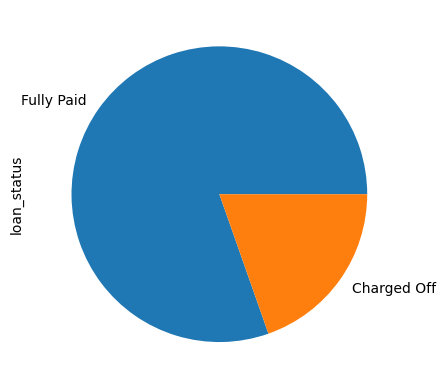

In [183]:
df.loan_status.value_counts(normalize=True).plot(kind='pie')
plt.show()

In [184]:
target = "loan_status"
cat_columns = df.select_dtypes(include=['object']).columns.tolist()
cat_columns.remove(target)

In [185]:
num_columns = df.select_dtypes(exclude=['object']).columns.tolist()

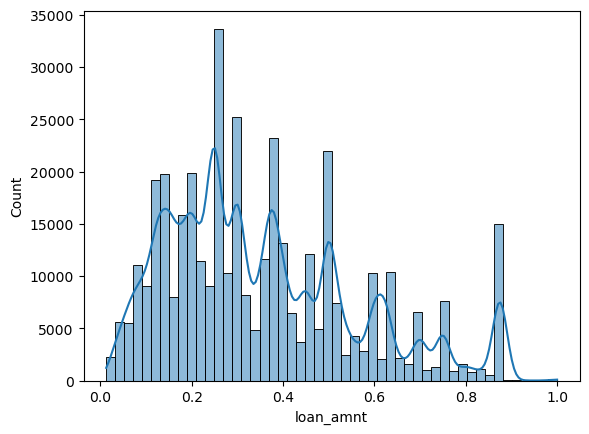

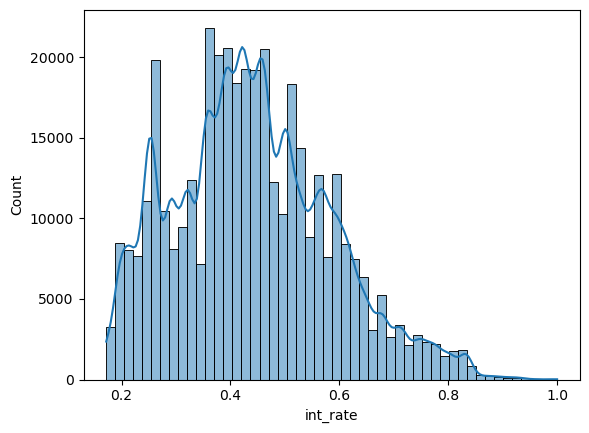

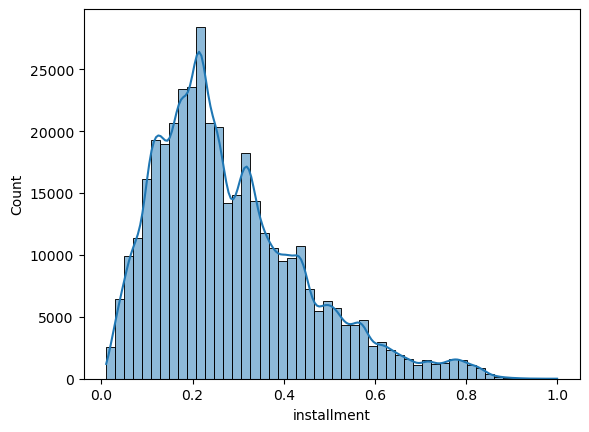

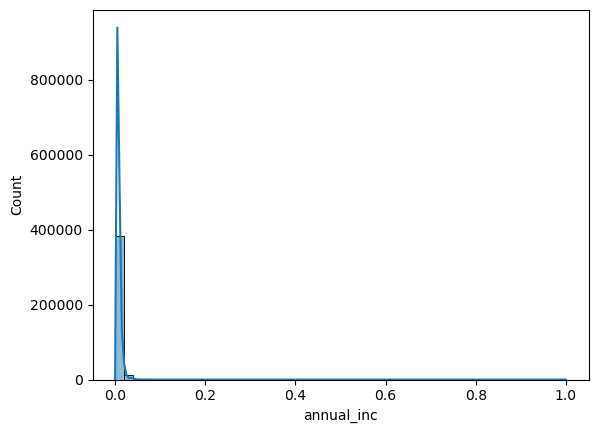

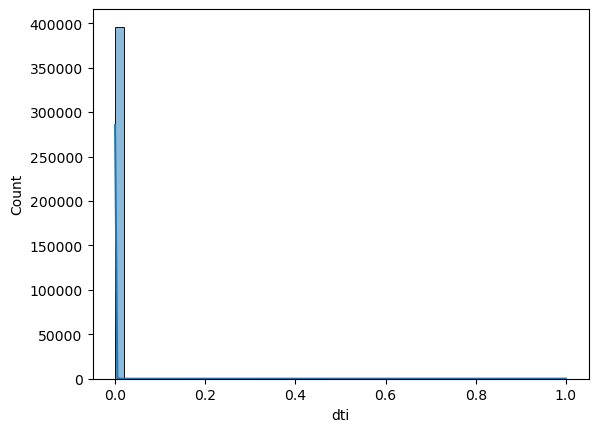

...

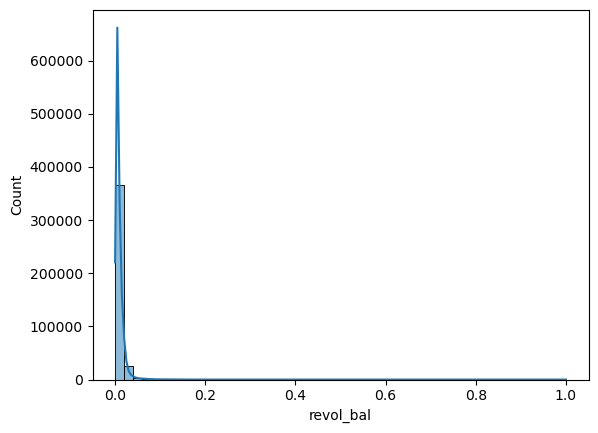

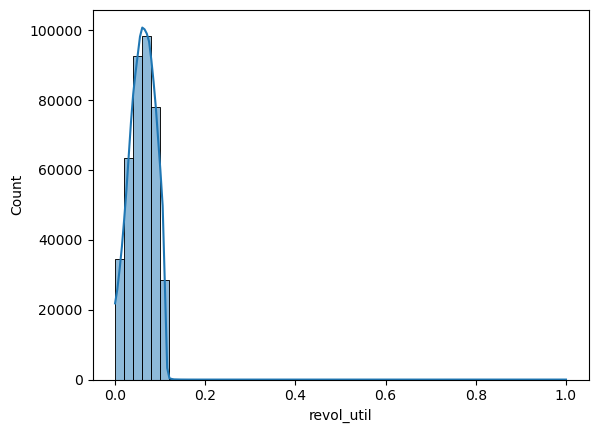

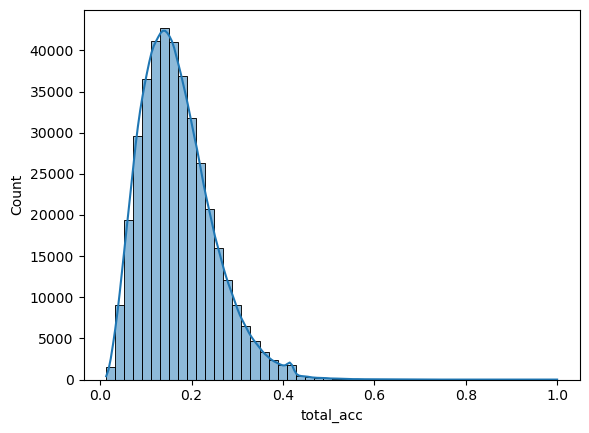

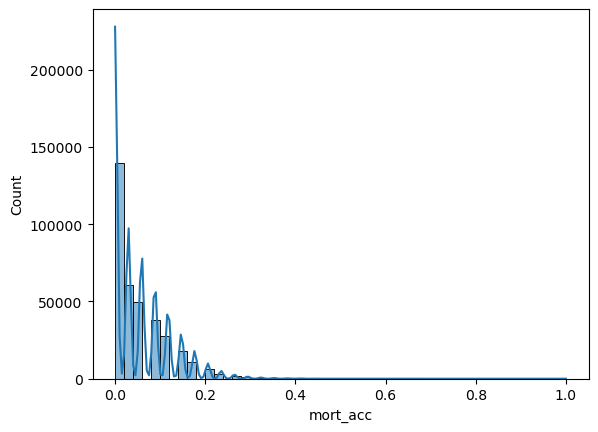

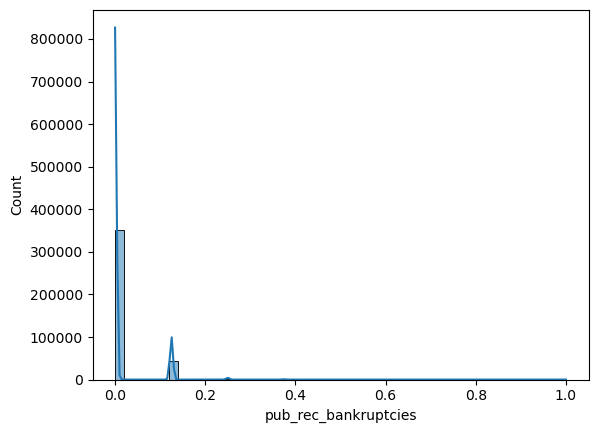

In [186]:
for i in num_columns:
    sns.histplot(df[i]/df[i].max(), kde=True, bins=50)
    plt.show()

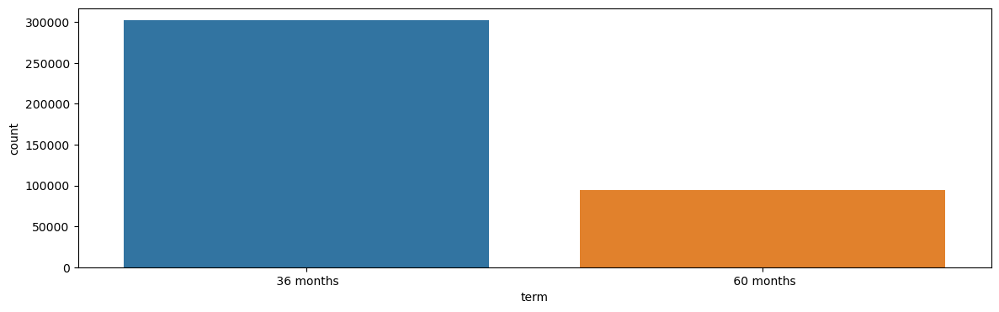

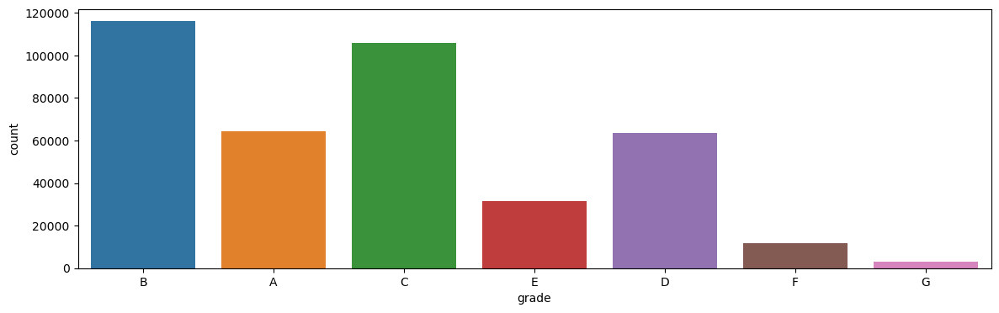

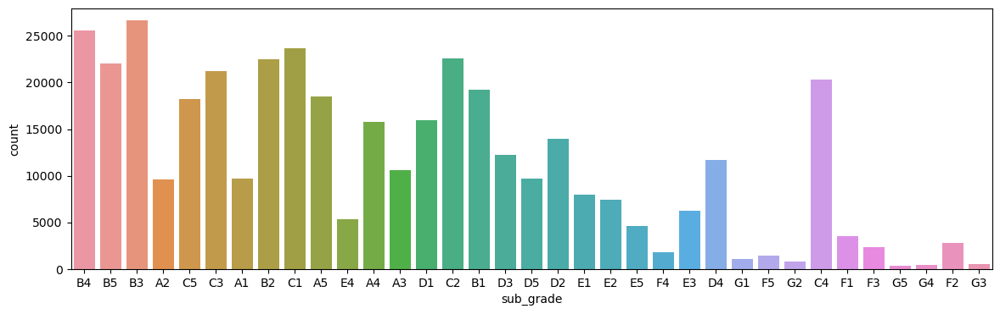

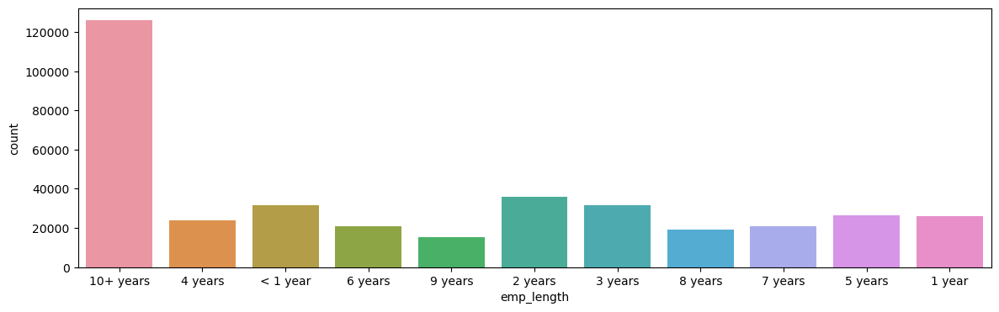

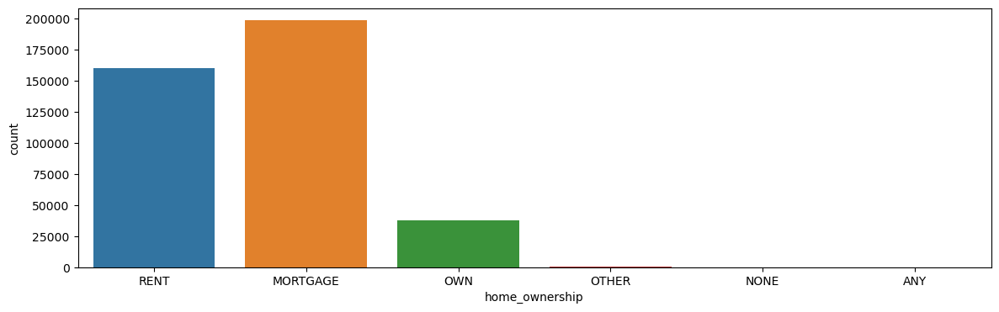

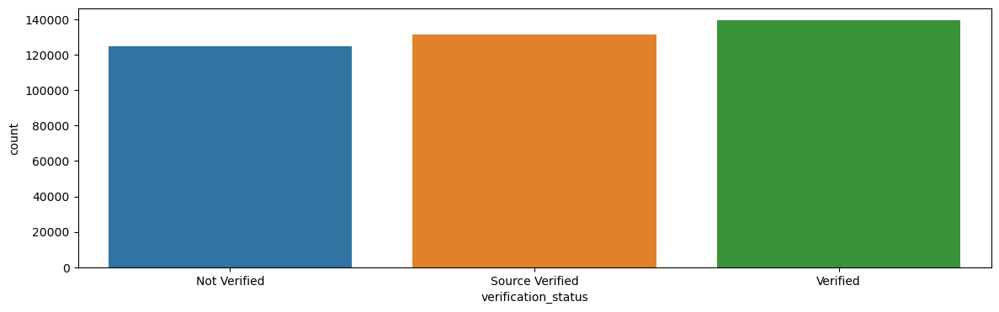

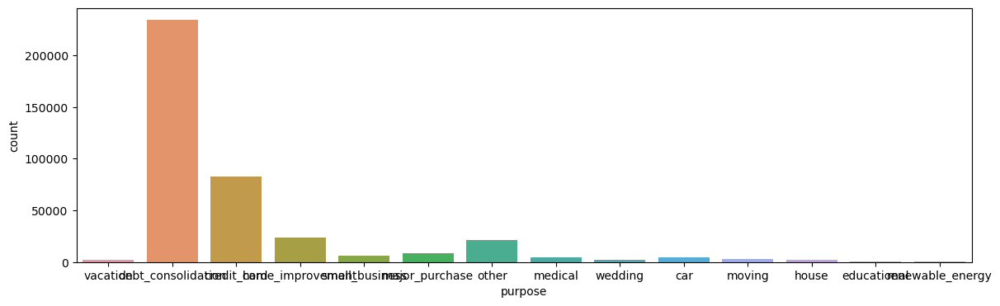

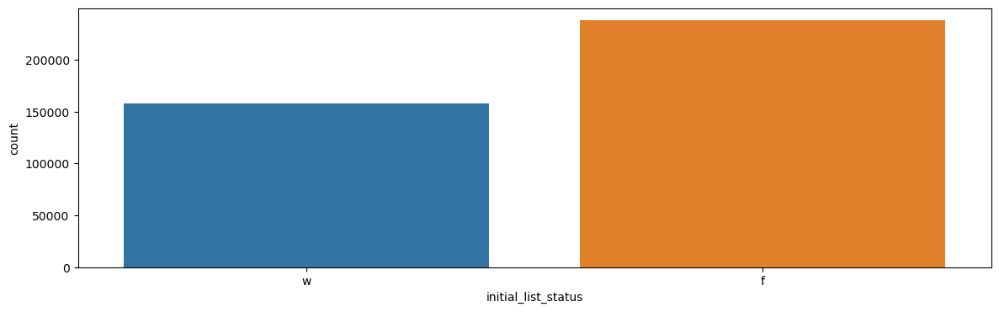

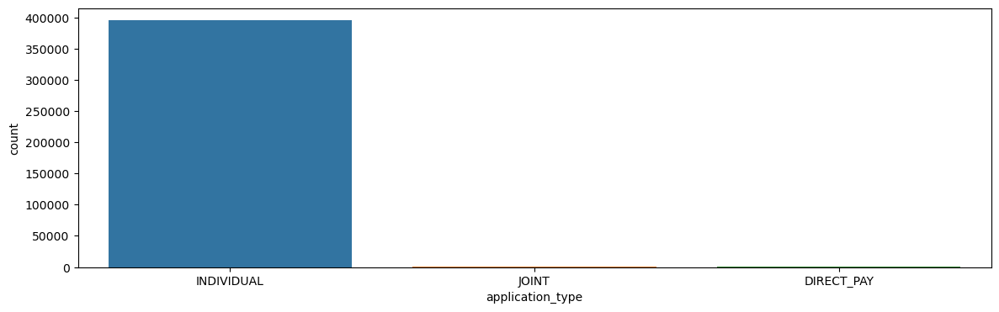

In [187]:
to_ignore = ('emp_title', 'issue_d', 'title', 'earliest_cr_line', 'address')
for col in cat_columns:
    if col not in to_ignore:
        plt.figure(figsize=(14,4))
        sns.countplot(data=df, x=col)
        plt.show()

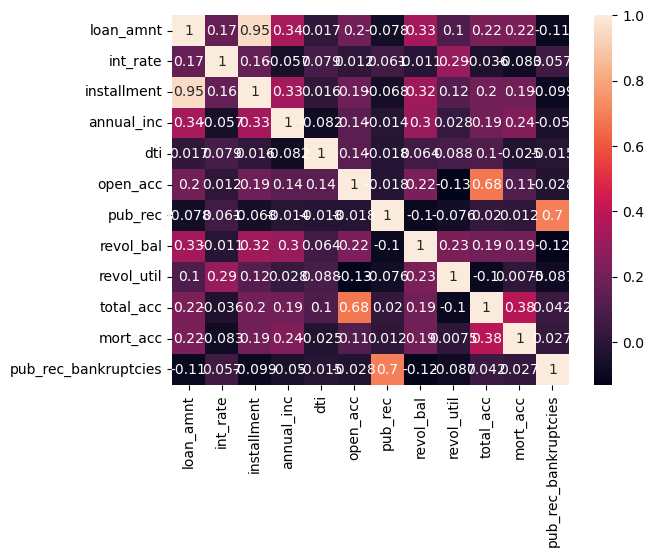

In [188]:
sns.heatmap(data = df.corr(), annot = True)
plt.show()

In [189]:
df.drop(columns=['installment'],axis=1,inplace=True)

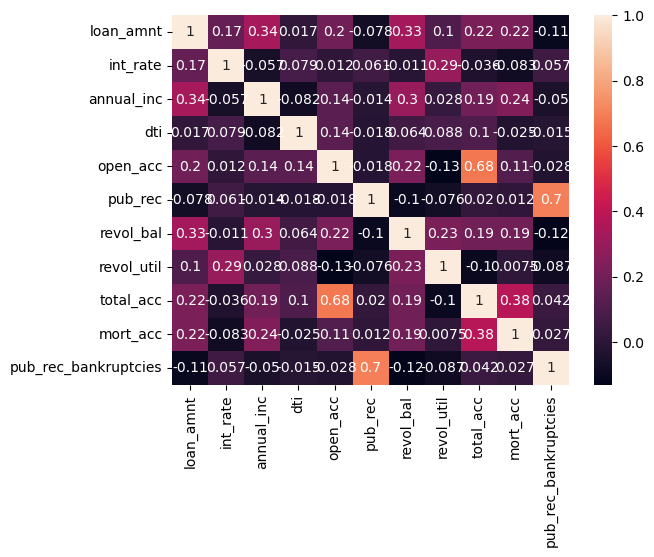

In [190]:
sns.heatmap(data = df.corr(), annot = True)
plt.show()

In [191]:
num_columns.remove("installment")

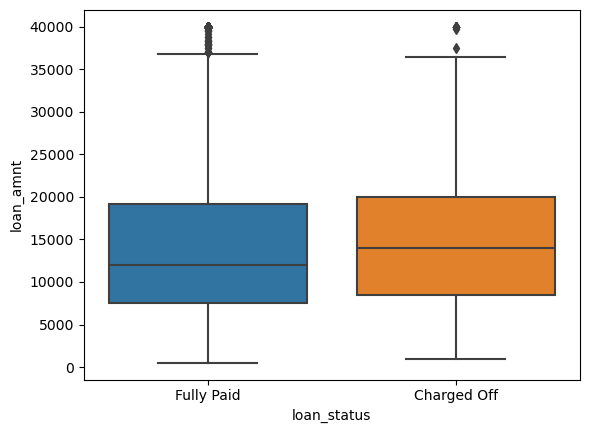

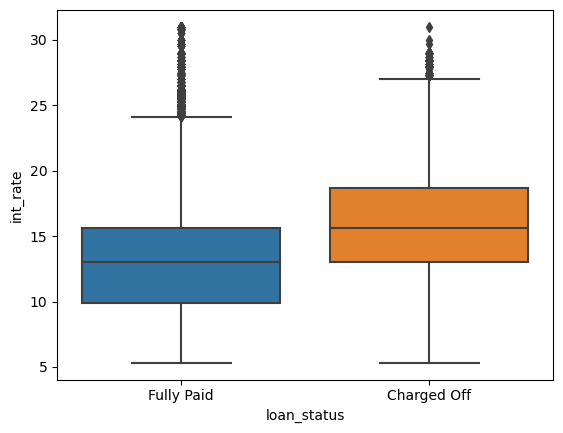

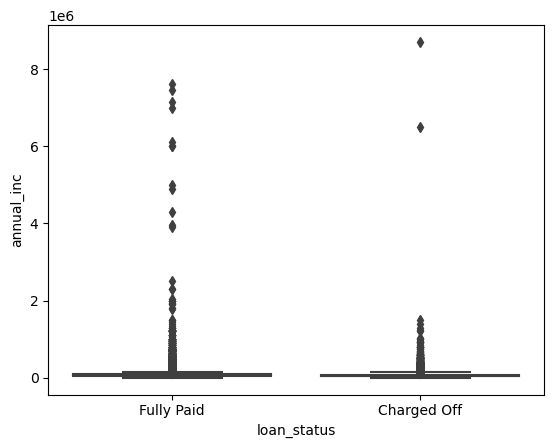

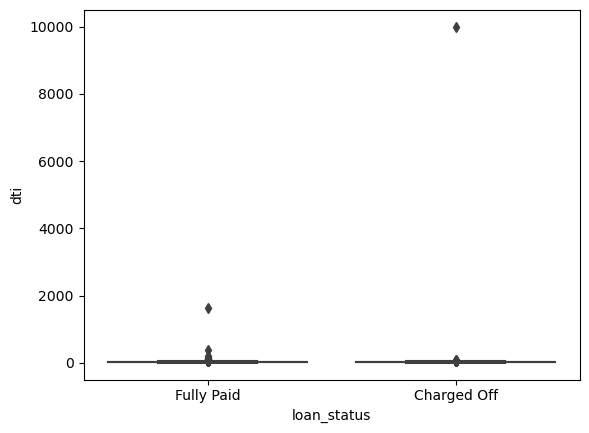

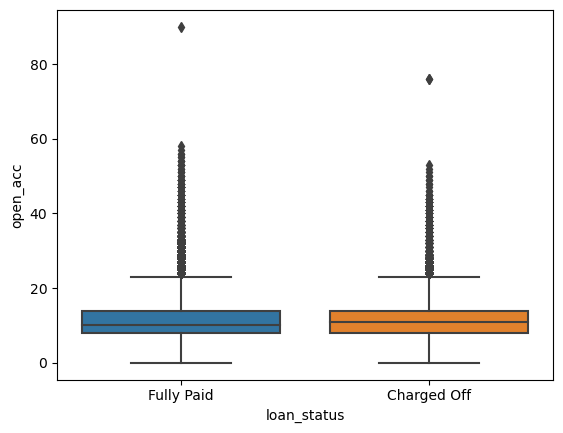

...

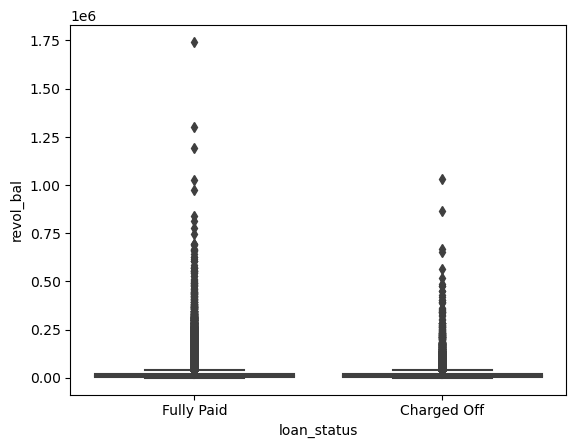

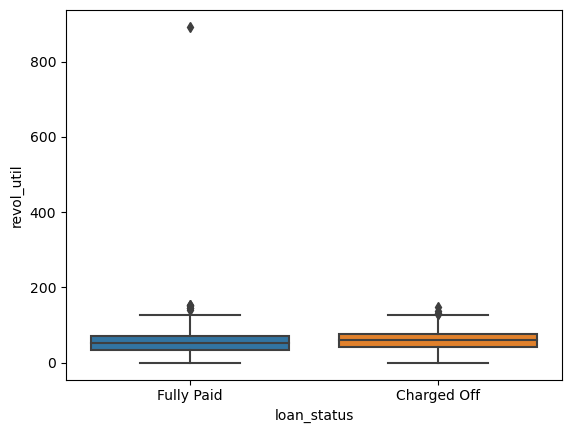

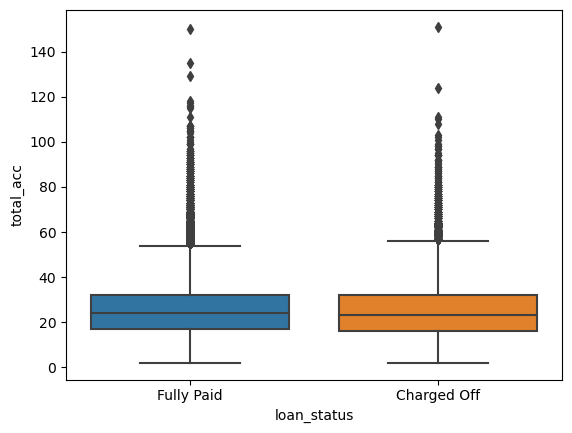

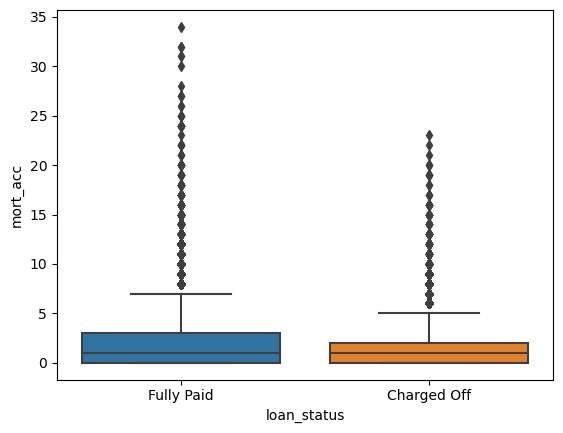

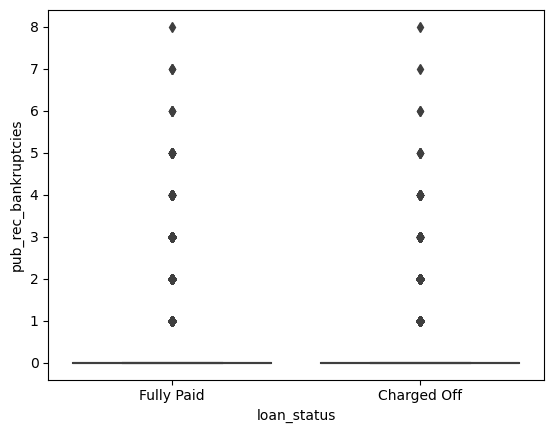

In [192]:
for col in num_columns:
    sns.boxplot(x=target, y=col, data=df)
    plt.show()

In [193]:
df.groupby(by='loan_status')['loan_amnt'].describe()

,count,mean,std,min,25%,50%,75%,max
loan_status,,,,,,,,
Charged Off,77673.0,15126.300967,8505.090557,1000.0,8525.0,14000.0,20000.0,40000.0
Fully Paid,318357.0,13866.878771,8302.319699,500.0,7500.0,12000.0,19225.0,40000.0


In [194]:
df['home_ownership'].value_counts()

MORTGAGE    198348
RENT        159790
OWN          37746
OTHER          112
NONE            31
ANY              3
Name: home_ownership, dtype: int64

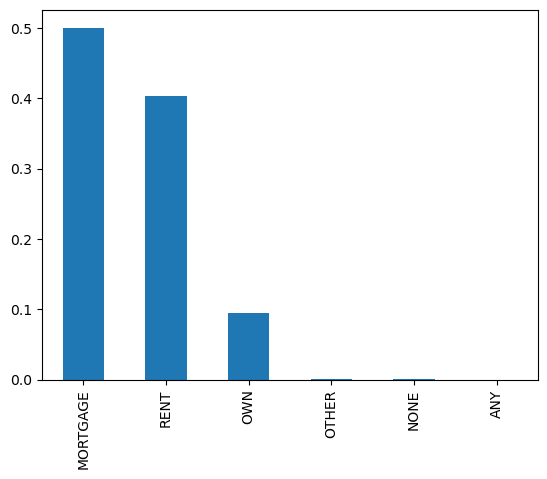

In [195]:
df['home_ownership'].value_counts(normalize = True).plot(kind="bar")
plt.show()

In [196]:
df.loc[(df.home_ownership == 'ANY') | (df.home_ownership == 'NONE'), 'home_ownership'] = 'OTHER'
df.home_ownership.value_counts()

MORTGAGE    198348
RENT        159790
OWN          37746
OTHER          146
Name: home_ownership, dtype: int64

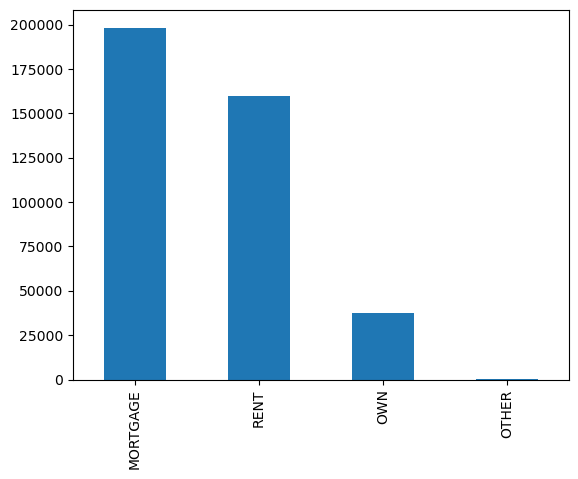

In [197]:
df.home_ownership.value_counts().plot(kind="bar")
plt.show()

In [198]:
df['issue_d']=pd.to_datetime(df['issue_d'])
df['earliest_cr_line']=pd.to_datetime(df['earliest_cr_line'])

In [199]:
df['emp_title'].value_counts().sort_values(ascending=False)

Teacher                                                                           4389
Manager                                                                           4250
Registered Nurse                                                                  1856
RN                                                                                1846
Supervisor                                                                        1830
Sales                                                                             1638
Project Manager                                                                   1505
Owner                                                                             1410
Driver                                                                            1339
Office Manager                                                                    1218
manager                                                                           1145
Director                                   

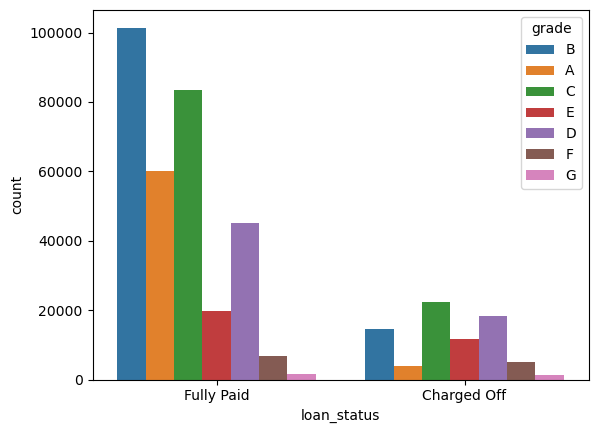

In [200]:
sns.countplot(x=target, data=df, hue='grade')
plt.show()

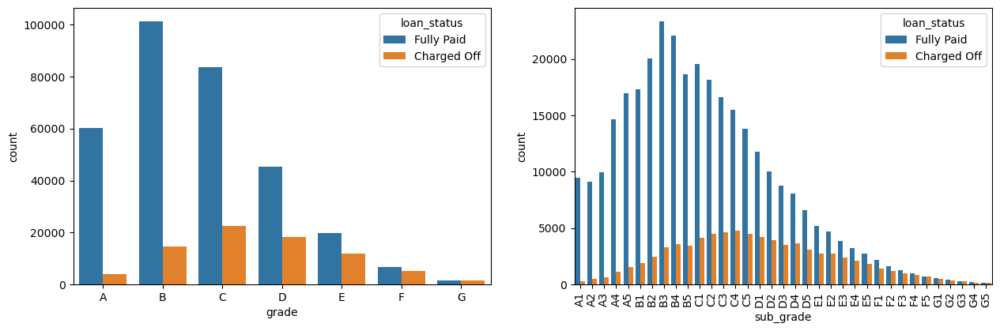

In [201]:
plt.figure(figsize=(15, 10))

plt.subplot(2, 2, 1)
grade = sorted(df.grade.unique().tolist())
sns.countplot(x='grade', data=df, hue='loan_status', order=grade)

plt.subplot(2, 2, 2)
sub_grade = sorted(df.sub_grade.unique().tolist())
g = sns.countplot(x='sub_grade', data=df, hue='loan_status', order=sub_grade)
g.set_xticklabels(g.get_xticklabels(), rotation=90)
plt.show()

In [202]:
df['mort_acc'] = df['mort_acc'].fillna(0.0)
df['emp_title'] = df['emp_title'].fillna("unknown_emp_title")
df['emp_length'] = df['emp_length'].fillna("unknown_emp_length")
df['title'] = df['mort_acc'].fillna("unknown_title")
df['pub_rec_bankruptcies'] = df['pub_rec_bankruptcies'].fillna(0.0)

In [203]:
df['loan_status']=df.loan_status.map({'Fully Paid':0, 'Charged Off':1})

In [204]:
df.groupby(by='total_acc').mean()

,loan_amnt,int_rate,annual_inc,loan_status,title,dti,open_acc,pub_rec,revol_bal,revol_util,mort_acc,pub_rec_bankruptcies
total_acc,,,,,,,,,,,,
2.0,6672.222222,15.801111,64277.777778,0.222222,0.000000,2.279444,1.611111,0.000000,2860.166667,53.527778,0.000000,0.000000
3.0,6042.966361,15.615566,41270.753884,0.220183,0.027523,6.502813,2.611621,0.045872,3382.807339,49.991022,0.027523,0.015291
4.0,7587.399031,15.069491,42426.565969,0.214055,0.046850,8.411963,3.324717,0.041195,4874.231826,58.477400,0.046850,0.022617
5.0,7845.734714,14.917564,44394.098003,0.203156,0.077416,10.118328,3.921598,0.071499,5475.253452,56.890311,0.077416,0.040927
6.0,8529.019843,14.651752,48470.001156,0.215874,0.120082,11.222542,4.511119,0.104003,6546.374957,57.812483,0.120082,0.054738
7.0,9350.283611,14.415810,50623.501002,0.211200,0.180545,11.829829,5.093169,0.116099,7363.941588,56.787540,0.180545,0.062515
8.0,9788.345760,14.271851,52571.393657,0.217707,0.254613,12.684623,5.576887,0.143523,7850.161603,57.348173,0.254613,0.081081
9.0,10042.600597,14.244870,52572.312693,0.213141,0.308394,13.296349,6.028765,0.161584,8205.770041,56.583065,0.308394,0.093210
10.0,10487.255605,14.109811,55751.004093,0.205553,0.367570,14.004592,6.466111,0.146507,9124.531283,57.029202,0.367570,0.093717


In [205]:
total_act_mean = df.groupby(by='total_acc').mean().mort_acc

In [206]:
df.isnull().sum()

loan_amnt                 0
term                      0
int_rate                  0
grade                     0
sub_grade                 0
emp_title                 0
emp_length                0
home_ownership            0
annual_inc                0
verification_status       0
issue_d                   0
loan_status               0
purpose                   0
title                     0
dti                       0
earliest_cr_line          0
open_acc                  0
pub_rec                   0
revol_bal                 0
revol_util              276
total_acc                 0
initial_list_status       0
application_type          0
mort_acc                  0
pub_rec_bankruptcies      0
address                   0
dtype: int64

In [207]:
df.dropna(inplace=True)

In [208]:
df.isnull().sum()

loan_amnt               0
term                    0
int_rate                0
grade                   0
sub_grade               0
emp_title               0
emp_length              0
home_ownership          0
annual_inc              0
verification_status     0
issue_d                 0
loan_status             0
purpose                 0
title                   0
dti                     0
earliest_cr_line        0
open_acc                0
pub_rec                 0
revol_bal               0
revol_util              0
total_acc               0
initial_list_status     0
application_type        0
mort_acc                0
pub_rec_bankruptcies    0
address                 0
dtype: int64

In [209]:
df.shape

(395754, 26)

In [210]:
df.term.unique()

array([' 36 months', ' 60 months'], dtype=object)

In [211]:
term_values={' 36 months': 36, ' 60 months':60}
df['term'] = df.term.map(term_values)

In [212]:
df['initial_list_status'].unique()

array(['w', 'f'], dtype=object)

In [213]:
list_status = {'w':0, 'f':1}
df['initial_list_status'] = df.initial_list_status.map(list_status)

In [214]:
df['zip_code'] = df.address.apply(lambda x: x[-5:])

In [215]:
df['zip_code'].value_counts(normalize=True)*100

70466    14.388484
30723    14.275535
22690    14.275029
48052    14.120893
00813    11.571077
29597    11.485670
05113    11.462424
11650     2.834336
93700     2.814122
86630     2.772429
Name: zip_code, dtype: float64

<AxesSubplot:>

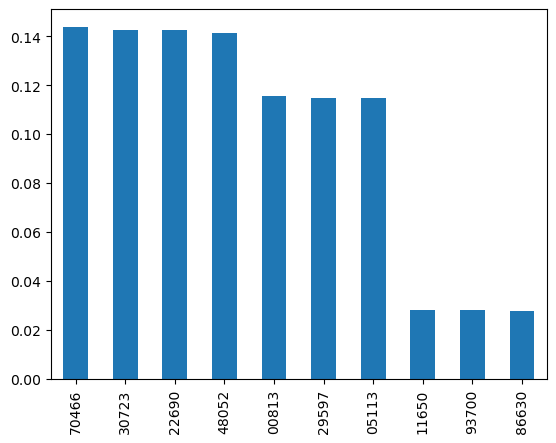

In [216]:
df['zip_code'].value_counts(normalize=True).plot(kind='bar')

In [217]:
df.drop(columns=['issue_d','emp_title','title','sub_grade','address','earliest_cr_line','emp_length'], axis=1, inplace=True)

In [218]:
dummie = ['purpose','zip_code','grade','verification_status','application_type','home_ownership']
df=pd.get_dummies(df, columns=dummie, drop_first=True)

In [219]:
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

df.head()

,loan_amnt,term,int_rate,annual_inc,loan_status,dti,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,mort_acc,pub_rec_bankruptcies,purpose_credit_card,purpose_debt_consolidation,purpose_educational,purpose_home_improvement,purpose_house,purpose_major_purchase,purpose_medical,purpose_moving,purpose_other,purpose_renewable_energy,purpose_small_business,purpose_vacation,purpose_wedding,zip_code_05113,zip_code_11650,zip_code_22690,zip_code_29597,zip_code_30723,zip_code_48052,zip_code_70466,zip_code_86630,zip_code_93700,grade_B,grade_C,grade_D,grade_E,grade_F,grade_G,verification_status_Source Verified,verification_status_Verified,application_type_INDIVIDUAL,application_type_JOINT,home_ownership_OTHER,home_ownership_OWN,home_ownership_RENT
0,10000.0,36,11.44,117000.0,0,26.24,16.0,0.0,36369.0,41.8,25.0,0,0.0,0.0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,1
1,8000.0,36,11.99,65000.0,0,22.05,17.0,0.0,20131.0,53.3,27.0,1,3.0,0.0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0
2,15600.0,36,10.49,43057.0,0,12.79,13.0,0.0,11987.0,92.2,26.0,1,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,1,0,0,0,1
3,7200.0,36,6.49,54000.0,0,2.60,6.0,0.0,5472.0,21.5,13.0,1,0.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1
4,24375.0,60,17.27,55000.0,1,33.95,13.0,0.0,24584.0,69.8,43.0,1,1.0,0.0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,1,0,0,0,0


In [220]:
df.shape

(395754, 49)

In [221]:
X=df.drop('loan_status', axis=1)
y=df['loan_status']

In [222]:
from scipy import stats
from sklearn.linear_model import LogisticRegression
from sklearn import metrics
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve
from sklearn.model_selection import train_test_split, KFold, cross_val_score
from sklearn.preprocessing import MinMaxScaler
from sklearn.metrics import (
    accuracy_score, confusion_matrix, classification_report, 
    roc_auc_score, roc_curve, auc,
    ConfusionMatrixDisplay, RocCurveDisplay
)
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [223]:
X_train, X_test, y_train, y_test = train_test_split(X,y,test_size=0.2, stratify=y, random_state=42)

In [224]:
print(X_train.shape)
print(X_test.shape)

(316603, 48)
(79151, 48)


In [225]:
scale = MinMaxScaler()
X_train = scale.fit_transform(X_train)
X_test = scale.fit_transform(X_test)

In [226]:
Log_R = LogisticRegression(max_iter=1000)
Log_R.fit(X_train, y_train)

LogisticRegression(max_iter=1000)

In [227]:
y_pred = Log_R.predict(X_test)

In [228]:
print("Accuracy of the model on test :", Log_R.score(X_test, y_test).round(2))

Accuracy of the model on test : 0.81


In [229]:
confusion_matrix=confusion_matrix(y_test,y_pred)
print(confusion_matrix)

[[52866 10763]
 [ 3994 11528]]


In [230]:
print(classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.93      0.83      0.88     63629
           1       0.52      0.74      0.61     15522

    accuracy                           0.81     79151
   macro avg       0.72      0.79      0.74     79151
weighted avg       0.85      0.81      0.83     79151



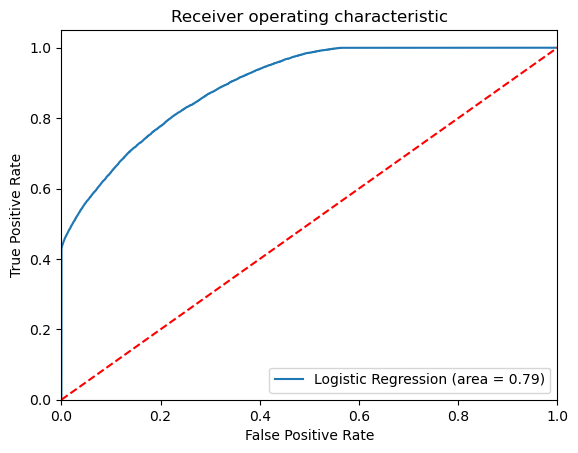

In [231]:
logit_roc_auc=roc_auc_score(y_test,Log_R.predict(X_test))
fpr,tpr,thresholds=roc_curve(y_test,Log_R.predict_proba(X_test)[:,1])
plt.figure()
plt.plot(fpr,tpr,label='Logistic Regression (area = %0.2f)' % logit_roc_auc)
plt.plot([0,1],[0,1],'r--')
plt.xlim([0.0,1.0])
plt.ylim([0.0,1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic')
plt.legend(loc="lower right")
plt.show()

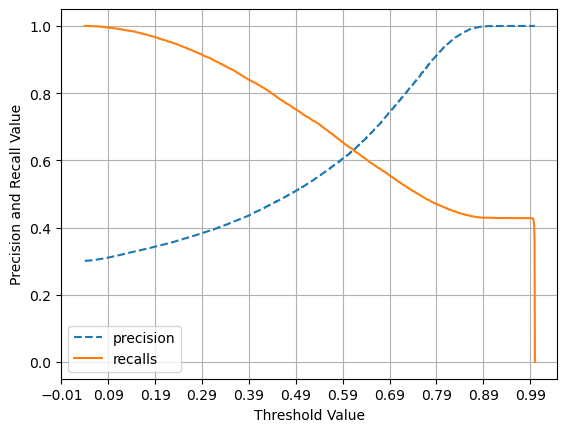

In [232]:
def precission_recall_curve_plot(y_test,pred_proba_c1):
    precisions, recalls, thresholds = precision_recall_curve(y_test,pred_proba_c1)
    
    threshold_boundary = thresholds.shape[0]
    
    plt.plot(thresholds,precisions[0:threshold_boundary],linestyle='--',label='precision')
    
    plt.plot(thresholds,recalls[0:threshold_boundary],label='recalls')
    
    start,end=plt.xlim()
    plt.xticks(np.round(np.arange(start,end,0.1),2))
    
    plt.xlabel('Threshold Value')
    plt.ylabel('Precision and Recall Value')
    plt.legend()
    plt.grid()
    plt.show()

precission_recall_curve_plot(y_test,Log_R.predict_proba(X_test)[:,1])

In [233]:
def calc_vif(X):
    vif=pd.DataFrame()
    vif['Feature']=X.columns
    vif['VIF']=[variance_inflation_factor(X.values,i) for i in range(X.shape[1])]
    vif['VIF']=round(vif['VIF'],2)
    vif=vif.sort_values(by='VIF',ascending=False)
    return vif

calc_vif(X)[:5]

,Feature,VIF
43,application_type_INDIVIDUAL,138.14
2,int_rate,118.98
14,purpose_debt_consolidation,49.23
1,term,26.81
13,purpose_credit_card,18.10


In [234]:
X.drop(columns=['application_type_INDIVIDUAL'],axis=1,inplace=True)
calc_vif(X)[:5]

,Feature,VIF
2,int_rate,101.93
14,purpose_debt_consolidation,25.69
1,term,23.82
9,total_acc,12.51
5,open_acc,12.07


In [235]:
X.drop(columns=['int_rate'], axis=1, inplace=True)
calc_vif(X)[:5]

,Feature,VIF
1,term,22.85
13,purpose_debt_consolidation,20.25
8,total_acc,12.51
4,open_acc,11.99
12,purpose_credit_card,7.88


In [236]:
X.drop(columns=['term'], axis=1, inplace=True)
calc_vif(X)[:5]

,Feature,VIF
12,purpose_debt_consolidation,15.61
7,total_acc,12.44
3,open_acc,11.99
6,revol_util,7.51
11,purpose_credit_card,6.19


In [237]:
X.drop(columns=['purpose_debt_consolidation'], axis=1, inplace=True)
calc_vif(X)[:5]

,Feature,VIF
7,total_acc,12.31
3,open_acc,11.47
6,revol_util,6.66
0,loan_amnt,5.58
1,annual_inc,3.03


In [238]:
X.drop(columns=['open_acc'], axis=1, inplace=True)
calc_vif(X)[:5]

,Feature,VIF
5,revol_util,6.61
6,total_acc,6.06
0,loan_amnt,5.55
1,annual_inc,3.03
32,grade_C,2.85


In [239]:
X=scaler.fit_transform(X)

kfold=KFold(n_splits=5)
accuracy=np.mean(cross_val_score(Log_R,X,y,cv=kfold,scoring='accuracy',n_jobs=-1))
print("Cross Validation accuracy : {:.3f}".format(accuracy))

Cross Validation accuracy : 0.888
